<h1> Airbnb project: What impacts the Airbnb’s Spatial Distribution in U.S. cities?</h1>
<p> team BeautifulSoap4:
<li> Ming Jin, Yuemeng Zhang, Zijie Ding, Leyi Mai

<h2> Part 1: Data Preprocessing

In [ ]:
# install necessary package
pip install uszipcode
pip install cufflinks
pip install https://github.com/scikit-learn-contrib/scikit-learn-extra/archive/master.zip  #install sklearn_extra

In [186]:
import numpy                 as np
import pandas                as pd
import matplotlib.pyplot     as plt
import seaborn               as sns
import sklearn.metrics       as Metrics
from uszipcode import SearchEngine
from wordcloud import WordCloud, STOPWORDS
import folium  #needed for interactive map
from folium.plugins import HeatMap
import plotly.graph_objects as go
import plotly.express as px
import branca.colormap as cm
from plotly.offline import iplot, init_notebook_mode
import cufflinks as cf

from   collections             import Counter
from   collections             import defaultdict
from   sklearn                 import preprocessing
from   sklearn                 import decomposition
from   datetime                import datetime
from   math                    import exp
from   sklearn.linear_model    import LinearRegression as LinReg
from   sklearn.linear_model    import LinearRegression 
from   sklearn.metrics         import mean_absolute_error
from   sklearn.metrics         import median_absolute_error
from   sklearn.metrics         import r2_score
from   sklearn.model_selection import ShuffleSplit
from   sklearn.ensemble        import RandomForestRegressor
from   sklearn.manifold        import TSNE
from   sklearn.cluster         import MeanShift, estimate_bandwidth
from   sklearn.cluster         import KMeans
from   sklearn_extra.cluster   import KMedoids
from   sklearn.cluster         import DBSCAN
from   sklearn                 import metrics
from   scipy.cluster           import hierarchy
from   scipy.spatial.distance  import pdist
from   sklearn.mixture         import GaussianMixture
from   scipy.stats             import multivariate_normal as mvn
import statsmodels.formula.api as smf
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set(style='white')
cf.go_offline(connected=True)
init_notebook_mode(connected=True)
mapbox_token ='pk.eyJ1IjoibWFnZ2llNjE2IiwiYSI6ImNrMnFvOGZhazAwdXYzY3BydHYxMnV2ZXMifQ.kgmjVzysiQkB8aKVBylDhQ'

<h3>1-1 data from csv files

<p>We collect airbnb listing data, transportation data, venue, crime data, rent data, and c-distance data by downloading csv from online sources. </p>
<li>Detailed description of data are shown in the table on page 6 of the slides.
<li>The raw data of crime, transportation and c-distances requires additional preprocessing (see the folder of crime_data, transportation, zipcode_level_data for codes)

In [2]:
#listing data
bos = pd.read_csv('airbnb_data/boston_listings.csv')
ny = pd.read_csv('airbnb_data/NY_listings.csv')
dc = pd.read_csv('airbnb_data/dc_listings.csv')

#transportation
bus = pd.read_csv('transportation_data/bus_with_zipcode.csv',
                  usecols=['stop_lon', 'stop_lat','city','zipcode'])
bus.columns =['longitude', 'latitude','city','zipcode']
sub = pd.read_csv('transportation_data/subway_with_zipcode.csv',
                  usecols=['station_lon','station_lat', 'city', 'zipcode'])
sub.columns = ['longitude', 'latitude','city','zipcode']

#venue
bos_venue = pd.read_csv('venue_data/bos_venue_cleaned.csv')
ny_venue = pd.read_csv('venue_data/ny_venue_cleaned.csv')
dc_venue = pd.read_csv('venue_data/dc_venue_cleaned.csv')

#crime
bos_crime = pd.read_csv('crime_data/bos_crime_zipcode.csv',usecols=['Lat','Long','Zipcode'])
ny_crime = pd.read_csv('crime_data/ny_crime_zipcode.csv',usecols=['Lat','Long' ,'Zipcode'])
dc_crime = pd.read_csv('crime_data/dc_crime_zipcode.csv',usecols=['Lat','Long' ,'Zipcode'])
for table in [bos_crime,ny_crime,dc_crime]:
    table.columns= ['latitude','longitude','zipcode']
#rent
rent = pd.read_csv('zipcode_level_data/zillow_rent_index.csv',encoding='latin-1',usecols=['RegionName','Zri'])
rent.columns =['zipcode','zillow_rent_index']
rent['zipcode'] = rent['zipcode'].apply(lambda x:str(x).zfill(5))

#c-distance
bos_dis =pd.read_csv('zipcode_level_data/bos_data_by_zipcode_with_C-distance.csv',usecols=['zipcode','C-distance_bc', 'C-distance_ch'])
ny_dis =pd.read_csv('zipcode_level_data/ny_data_by_zipcode_with_C-distance.csv',usecols=['zipcode','C-distance_ts', 'C-distance_ch'])
dc_dis =pd.read_csv('zipcode_level_data/dc_data_by_zipcode_with_C-distance.csv',usecols=['zipcode','C-distance_wh', 'C-distance_ch'])
for df in [bos_dis,ny_dis,dc_dis]:
    df['zipcode'] = df['zipcode'].apply(lambda x:str(x).zfill(5))


/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning:

Columns (61,62,94,95) have mixed types. Specify dtype option on import or set low_memory=False.

/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning:

Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.



In [3]:
def clean_listing(list_):
    use_col = ['id','name','city','state','zipcode','price','bedrooms',\
               'latitude','longitude','number_of_reviews',\
               'review_scores_location','review_scores_value']
    try:
        list_['price']= list_['price'].apply(lambda x:float(x.strip('$').replace(',','')))
    except:
        None    
    def fix_zip(input_zip):
        try:
            input_zip = int(input_zip)
        except:
            try:
                input_zip = int(input_zip.split('-')[0])
            except:
                try:
                    input_zip = int(input_zip.split(' ')[1])
                except:
                    return np.NaN
        input_zip = str(input_zip).zfill(5)
        return input_zip
    list_['zipcode']=list_['zipcode'].apply(fix_zip)
    #drop zipcode is nan
    list_ = list_[~list_['zipcode'].isna()]
    list_ = list_[use_col] 
    return list_

In [4]:
def get_poi(venue):
    venue = venue.dropna()
    venue['zipcode'] = venue['zipcode'].apply(int)
    venue= venue.dropna(how='any')
    restaurant = venue.loc[venue['type']=='restaurant']
    market = venue.loc[venue['type']=='market']
    tourist_attractions = venue.loc[venue['type'].isin(['tourist_attraction','park'])]
    travel_agency =  venue.loc[venue['type']=='travel_agency']
    
    return restaurant,market,tourist_attractions,travel_agency

In [5]:
ny_list = clean_listing(ny)
bos_list = clean_listing(bos)
dc_list = clean_listing(dc)
ny_zipcodes = ny_list.zipcode.unique()
bos_zipcodes = bos_list.zipcode.unique()
dc_zipcodes = dc_list.zipcode.unique()

In [6]:
ny_restaurant,ny_market,ny_tourist_attractions,ny_travel_agency = get_poi(ny_venue)
bos_restaurant,bos_market,bos_tourist_attractions,bos_travel_agency = get_poi(bos_venue)
dc_restaurant,dc_market,dc_tourist_attractions,dc_travel_agency = get_poi(dc_venue)

<h3>1-2 data from uszipcode package

<p>Uszipcode is a programmable zipcode database in Python. It comes with a rich feature and provides a lots of data that we are interested in, such as real-estate data and demographics data.</p>
<li>To get some of the data from uszipcode, we wrote a python file named data_from_uszipcode.py (see the zipped folder for details)
<li>See https://pypi.org/project/uszipcode/ for uszipcode documentation: 

In [7]:
from data_from_uszipcode import get_population_df,population_final
from data_from_uszipcode import get_edu_employ_df,edu_employ_final
from data_from_uszipcode import get_estate_df

In [8]:
tables=dict()
zips= {'ny':ny_zipcodes,'bos':bos_zipcodes,'dc':dc_zipcodes}
cities= ['ny','bos','dc']
for i in range(3):
    city = cities[i]
    zipcodes = zips[city]
    age,race,income = get_population_df(zipcodes)
    population =population_final(age,race,income)
    edu,emp = get_edu_employ_df(zipcodes)
    edu_employ = edu_employ_final(edu,emp)
    estate = get_estate_df(zipcodes)
    final = pd.merge(population,edu_employ,left_index=True,right_index=True,copy=False)
    final = pd.merge(final,estate,left_index=True,right_index=True,copy=False)
    final = final.reset_index().rename(columns={'index':'zipcode'})
    tables[city]=final

<h3>1-3 Transform to zipcode level data

In [12]:
def ziplevel_df(zipcodes,listing,bus,sub,crime,restaurant,market,tourist_attractions,travel_agency,dist,demo):
    
    
    datasets = [bus,sub,crime,restaurant,market,tourist_attractions,travel_agency]
    names = ['bus','sub','crime','restaurant','market','tourist_attractions','travel_agency']
        
    
    grouped = listing.groupby(['zipcode'])
    base = grouped.agg({'id':'count','bedrooms':'sum','price':'mean','number_of_reviews':'sum',\
                          'review_scores_location':'mean','review_scores_value':"mean"})
    base.columns= ['num_of_airbnb','num_of_beds','avg_price','total_reviews','avg_location_review_score','avg_review_score']
    
    
    for i in range(len(datasets)):
        datasets[i]['zipcode']=datasets[i]['zipcode'].apply(lambda x: str(int(x)).zfill(5))
        datasets[i] = datasets[i][datasets[i].zipcode.isin(zipcodes)]
        num = datasets[i].groupby(['zipcode']).size()
        base[f'num_of_{names[i]}']= num
    
    base = base.reset_index().rename(columns={'index':'zipcode'})
    df = base.merge(demo,on='zipcode',copy=False, how='left')
    df = df.merge(dist,on='zipcode',copy=False, how='left')
    df = df.merge(rent,on='zipcode',copy=False, how='left')
    return df 

In [14]:
ny_zipcode_data = ziplevel_df(ny_zipcodes,ny_list,bus,sub,ny_crime,
                              ny_restaurant,ny_market,ny_tourist_attractions,
                              ny_travel_agency,ny_dis,tables['ny'])
bos_zipcode_data = ziplevel_df(bos_zipcodes,bos_list,bus,sub,bos_crime,
                              bos_restaurant,bos_market,bos_tourist_attractions,
                              bos_travel_agency,bos_dis,tables['bos'])
dc_zipcode_data = ziplevel_df(dc_zipcodes,dc_list,bus,sub,dc_crime,
                              dc_restaurant,dc_market,dc_tourist_attractions,
                              dc_travel_agency,dc_dis,tables['dc'])

In [84]:
ny_zipcode_data = ny_zipcode_data.fillna(0)
bos_zipcode_data = bos_zipcode_data.fillna(0)
dc_zipcode_data = dc_zipcode_data.fillna(0)

In [15]:
# A total of 135 features in the initial dataset
len(ny_zipcode_data.columns)

135

<h2> Part 2: Initial Exploration

<h3> 2-1 distribution heatmap (with folium)

In [88]:
def scater_map(list_,bus,sub,restaurant,market,tourist,crime,city):
    zipcodes = zips[city]
    datasets = [list_,bus,sub,restaurant,market,tourist,crime]
    names = ['airbnb','bus','subway','restaurant','market','tourist_arractions','crime']
    symbols = ['circle','bus','rail','restaurant','market','attraction','square']
    fig = go.Figure()
    for i in range(len(datasets)):
        table = datasets[i]
        table = table.loc[table.zipcode.isin(zipcodes)]
        fig.add_trace(go.Scattermapbox(
            lat=table.latitude,lon=table.longitude,mode='markers',
            marker=go.scattermapbox.Marker(size=6,opacity=0.7, symbol=symbols[i]),
            text=names[i],hoverinfo='text',showlegend=True,name =names[i]))

    fig.update_layout(
        title=f'Airbnb Distribution of {city}',autosize=False,height = 700,width = 1000,
        hovermode='closest',
        #showlegend=False,
        mapbox=go.layout.Mapbox(accesstoken=mapbox_token,bearing=0,
            center=go.layout.mapbox.Center(lat=list_.latitude.mean(),lon=list_.longitude.mean()),
            pitch=0,zoom=10,style='light'),)
    return fig

<h4> New York

In [89]:
ny_sizes = pd.DataFrame(ny_list.groupby('zipcode').size())
ny_sizes.rename(columns={0:"size"},inplace=True)
ny_sizes.reset_index(level=0, inplace=True)
ny_sizes['zipcode']= ny_sizes['zipcode'].apply(lambda x: str(int(x)).zfill(5))
m = folium.Map(location = [40.7589,-73.9851],zoom_start=12)

m.choropleth(geo_data='zipcode_geojson_data/ny_zipcode.geojson', data=ny_sizes,
             columns=[ 'zipcode','size'],
             key_on='feature.properties.postalCode',
             fill_color='Purples', fill_opacity=0.4, line_opacity=0.8,
             legend_name='Distribution of Airbnb')
folium.LayerControl().add_to(m)
m

/opt/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



In [90]:
ny_scater_fig = scater_map(ny_list,bus,sub,ny_restaurant,ny_market,ny_tourist_attractions,ny_crime,'ny')
ny_scater_fig.show()

<h4>Washington DC

In [91]:
dc_sizes = pd.DataFrame(dc_list.groupby('zipcode').size())
dc_sizes.rename(columns={0:"size"},inplace=True)
dc_sizes.reset_index(level=0, inplace=True)
dc_sizes['zipcode']= dc_sizes['zipcode'].apply(lambda x: str(int(x)).zfill(5))
m = folium.Map(location = [dc_list.latitude.mean(),dc_list.longitude.mean()],zoom_start=12)

m.choropleth(geo_data='zipcode_geojson_data/dc_district_of_columbia_zip_codes_geo.min.json', data=dc_sizes,
             columns=[ 'zipcode','size'],
             key_on='feature.properties.ZCTA5CE10',
             fill_color='Purples', fill_opacity=0.7, line_opacity=0.8,
             legend_name='Distribution of Airbnb')
folium.LayerControl().add_to(m)
m

In [92]:
dc_scater_fig = scater_map(dc_list,bus,sub,dc_restaurant,dc_market,dc_tourist_attractions,dc_crime,'dc')
dc_scater_fig.show()

<h4> Boston

In [93]:
bos_sizes = pd.DataFrame(bos_list.groupby('zipcode').size())
bos_sizes.rename(columns={0:"size"},inplace=True)
bos_sizes.reset_index(level=0, inplace=True)
bos_sizes['zipcode']= bos_sizes['zipcode'].apply(lambda x: str(int(x)).zfill(5))
m = folium.Map(location = [bos_list.latitude.mean(),bos_list.longitude.mean()],zoom_start=12)

m.choropleth(geo_data='zipcode_geojson_data/boston_ZIP_Codes.geojson', data=bos_sizes,
             columns=['zipcode','size'],
             key_on='feature.properties.ZIP5',
             fill_color='Purples', fill_opacity=0.7, line_opacity=0.8,
             legend_name='Distribution of Airbnb')
folium.LayerControl().add_to(m)
m

In [94]:
bos_scater_fig = scater_map(bos_list,bus,sub,bos_restaurant,bos_market,bos_tourist_attractions,bos_crime,'bos')
bos_scater_fig.show()

<h3> 2-2 word cloud

In [187]:
def get_wordcloud(df):
    # preprocess text data
    text = ''
    for i in list(df.neighborhood_overview.dropna()):
        text += i
    text = text.lower()
    # add and replace manually-selected unmeaningful stopwords
    other_stopword = {'new york','airbnb','city','street','boston','washington','dc',
                      'minute','minutes','walk','neighborhood','area','blocks', 'block',
                      'away','distance','walking'}
    def clean_text(text):
        for i in other_stopword:
            text = text.replace(i,'')
        return text  
    cleantext = clean_text(text)  
    # generate word cloud
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color='white',width=5000,height=5000).generate(cleantext)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

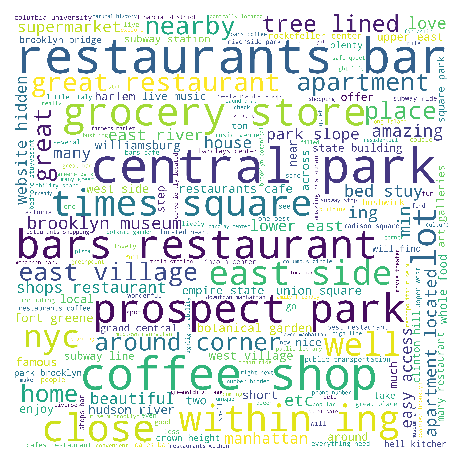

In [188]:
get_wordcloud(ny)  

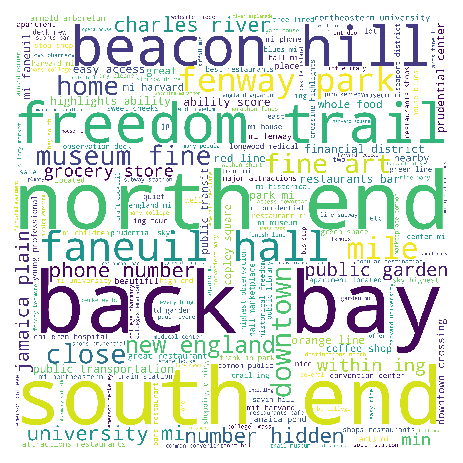

In [189]:
get_wordcloud(bos)

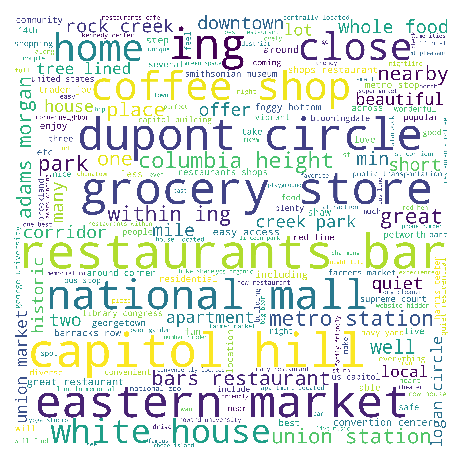

In [190]:
get_wordcloud(dc)  

<h2> Part 3: Feature Engineering

<h3> 3-1 correlation analysis

<h4>3-1-1 scatter plot analysis

In [97]:
ny_scatter = ny_zipcode_data.rename(columns={'1b_apt_monthly_rent':'one_b_apt_monthly_rent', '2b_apt_monthly_rent':'two_b_apt_monthly_rent', '3plus_b_apt_monthly_rent':'three_b_apt_monthly_rent'})

In [98]:
# price and total reviews
fig = px.scatter(ny_scatter, x="avg_location_review_score", y="avg_price",
                 color='total_reviews',range_x=[8.7,10.1],range_y=[20,500],
                width=800,height=400,opacity=0.6)
fig.show()

In [99]:
# c-distance and tourist attraction
fig = px.scatter(ny_scatter, x="C-distance_ch", y="num_of_airbnb",
                 color='num_of_tourist_attractions',range_x=[-3,32],
                width=800,height=400,opacity=0.6)
fig.show()

Airbnb distribution is highly tourism-related.
<li>Airbnb tends to have a positive correlation with the number of tourist attractions in the neighborhood, and a negative correlation with its distance from city center.

In [100]:
# sub and restaurant
fig = px.scatter(ny_scatter, x="num_of_sub", y="num_of_airbnb",
                 color='num_of_restaurant',
                width=800,height=400,opacity=0.6)
fig.show()

The more convenient the neighborhood is, the more airbnbs there are.
<li>Airbnb distribution is positively impacted by transportation and venues (restaurant) in the neighborhood.

In [101]:
# young and high education
ny_scatter['youth_20_to_39']= ny_scatter[['age:20-24','age:25-29','age:30-34','age:35-39']].apply(sum,axis=1)
ny_scatter['bachelor_above_percent']=ny_scatter[["bachelor's_degree_percent"  ,"master's_degree_percent","doctorate_degree_percent"]].apply(sum,axis=1)
fig = px.scatter(ny_scatter, x="youth_20_to_39", y="num_of_airbnb",
                 color='bachelor_above_percent',
                width=800,height=400,opacity=0.6)
fig.show()

In [112]:
# studio and new housing
ny_scatter['house_built_after_1990']= ny_scatter[['year_housing_was_built: 1990s','year_housing_was_built: 2000s','year_housing_was_built: 2010 Or Later']].apply(sum,axis=1)
fig = px.scatter(ny_scatter, x="rental_properties_by_number_of_rooms: Studio Apartment", y="num_of_airbnb",
                 color='house_built_after_1990',
                width=800,height=400,opacity=0.6)
fig.show()

Airbnb distribution seem to have positive correlation with the amount of studios and new housing.
<li>In terms of the real estate aspect, airbnbs are more likely to locate in regions with more studios and new housing (built after 1990)

In [102]:
#feature selected for modeling
ny_model= pd.read_csv('model_data/ny_model_final.csv') 
bos_model = pd.read_csv('model_data/bos_model_final.csv') 
dc_model = pd.read_csv('model_data/dc_model_final.csv') 

<h4>3-1-2 correlation heatmap

In [103]:
def heatMap(attr_name,x1,x2,y1,y2,width=20, height=4):
    ny_corr = ny_zipcode_data.corr().loc[list(ny_zipcode_data.columns)[x1:x2], 
                  list(ny_zipcode_data.columns)[y1:y2]]
    dc_corr = dc_zipcode_data.corr().loc[list(dc_zipcode_data.columns)[x1:x2], 
                  list(dc_zipcode_data.columns)[y1:y2]]
    bos_corr = bos_zipcode_data.corr().loc[list(bos_zipcode_data.columns)[x1:x2], 
                  list(bos_zipcode_data.columns)[y1:y2]]
    
    fig = plt.figure(figsize=(width,height))
    fig.suptitle(attr_name,fontsize=15)
    colormap = sns.diverging_palette(220, 10, as_cmap=True)
    plt.subplot(131)
    ax1 = sns.heatmap(ny_corr, cmap=colormap, annot=True, fmt=".2f")
    ax1.title.set_text('New York')
    ax1.set_ylim(len(ny_corr), -0.5)
    ylabel = list(ny_corr.index)
    ax1.set_yticklabels(ylabel,rotation=0)
    xlabel = ['#airbnb', '#beds', 'avg_price', '#reviews','avg_location_score','ave_total_score']
    ax1.set_xticklabels(xlabel,rotation=20)

    plt.subplot(132)
    ax2 = sns.heatmap(bos_corr, cmap=colormap, annot=True, fmt=".2f", yticklabels=False)
    ax2.title.set_text('Boston')
    ax2.set_ylim(len(bos_corr), -0.5)
    ax2.set_xticklabels(xlabel,rotation=20)
    
    plt.subplot(133)
    ax3= sns.heatmap(dc_corr, cmap=colormap, annot=True, fmt=".2f", yticklabels=False)
    ax3.title.set_text('Washington DC')
    ax3.set_ylim(len(dc_corr), -0.5)
    ax3.set_xticklabels(xlabel,rotation=20)

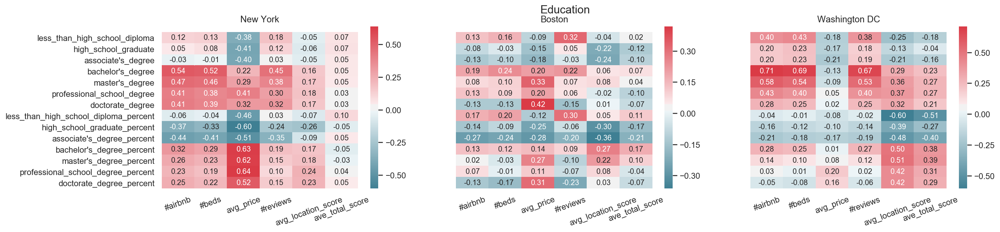

In [104]:
heatMap('Education',53,67,1,7)

Education rate impacts airbnb distribution:
<li>Generally, the percentage of people with higher education is highly correlated with number of airbnb
<li>Select the feature - the percentage of people with bachelor degree and above - for data modelling

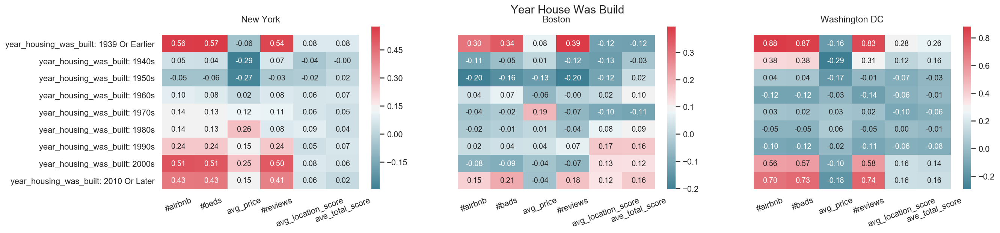

In [105]:
heatMap('Year House Was Build',76,85,1,7)

Number of newly-built housing impacts number of airbnbs:
<li>Generally people tend to choose newly built housing for airbnb
<li>Select the feature - num of housing built after 1990s - for data modeling

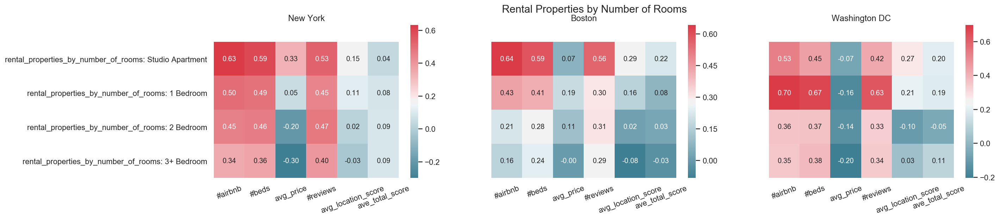

In [106]:
heatMap('Rental Properties by Number of Rooms',104,108,1,7)

Number of Studio greatly impacts number of airbnbs, specially for Boston
<li> Number of studio should be a key feature to input to the models

<h3> 3-2 feature importance analysis with random forest

In [107]:
def gini_feature_score(X,y,n_estimator=500,test_size=0.4):
    feature_names = X.columns
    rf= RandomForestRegressor(n_estimators=n_estimator)
    scores =defaultdict(list)
    avgscores =defaultdict(list)
    rs =ShuffleSplit(n_splits=10,test_size=0.4,random_state=0)
    for train_idx, test_idx in rs.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        Y_train, Y_test = y.iloc[train_idx], y.iloc[test_idx]
        r = rf.fit(X_train, Y_train)
        #acc = r2_score(Y_test, rf.predict(X_test))
        for i in range(X.shape[1]):
            scores[i].append(r.feature_importances_[i])
    for i,score in scores.items():
        avgscores[i]=round(np.mean(score),6)
        
        df=pd.DataFrame({'feature':feature_names[key],'importance':value} for key, value in avgscores.items())
        
    return df

In [108]:
def table_clean(df):    
    drop_columns= ['num_of_airbnb','avg_price','total_reviews','avg_location_review_score','avg_review_score','zipcode']    
    X= df.drop(columns=drop_columns)
    X.rename(columns={'0':'num_crime_in_half'},inplace=True)
    X = X.fillna(0)
    return X

<h4> new york sample 

In [109]:
ny_num_of_airbnb_score = gini_feature_score(table_clean(ny_model),ny_model['num_of_airbnb'])
ny_num_of_airbnb_score.sort_values(by='importance',ascending=False).head(10)

,feature,importance
5,num_of_tourist_attractions,0.227013
2,c_distance,0.162632
28,zillow_rent_index,0.095294
18,housing_built_after_1990,0.072591
3,num_of_restaurant,0.067521
9,youth_20_to_39,0.044447
4,num_of_market,0.039859
21,num_of_studio_apt,0.039348
26,Renter_Occupied_Households,0.034667
23,num_of_2b_apt,0.022613


In [110]:
ny_avg_price_score = gini_feature_score(table_clean(ny_model),ny_model['avg_price'])
ny_avg_price_score.sort_values(by='importance',ascending=False).head(10)

,feature,importance
15,bachelor_above_percentage,0.312447
28,zillow_rent_index,0.260122
2,c_distance,0.078161
12,American_Indian_Or_Alaskan_Native,0.061051
16,employment_rate,0.037849
14,household_income_less_than_25000_percent,0.027697
18,housing_built_after_1990,0.023739
25,vancancy_reason_For_Season_Recreational_Or_Occ...,0.020716
6,num_of_travel_agency,0.017356
3,num_of_restaurant,0.015900


In [115]:
bos_num_of_airbnb_score = gini_feature_score(table_clean(bos_model),bos_model['num_of_airbnb'])
bos_num_of_airbnb_score.sort_values(by='importance',ascending=False).head(10)

,feature,importance
17,crimes_in_half_year,0.327187
21,num_of_studio_apt,0.207139
14,household_income_less_than_25000_percent,0.063357
4,num_of_market,0.060608
1,num_of_sub,0.046954
3,num_of_restaurant,0.031185
22,num_of_1b_apt,0.030692
16,employment_rate,0.029333
9,youth_20_to_39,0.021266
13,Asian,0.017341


In [116]:
dc_num_of_airbnb_score = gini_feature_score(table_clean(dc_model),dc_model['num_of_airbnb'])
dc_num_of_airbnb_score.sort_values(by='importance',ascending=False).head(10)

,feature,importance
4,num_of_market,0.266755
9,youth_20_to_39,0.137197
3,num_of_restaurant,0.107438
17,crimes_in_half_year,0.079893
5,num_of_tourist_attractions,0.076318
22,num_of_1b_apt,0.054957
12,American_Indian_Or_Alaskan_Native,0.028407
2,c_distance,0.026547
21,num_of_studio_apt,0.024201
1,num_of_sub,0.024039


output features include:

<h2>Part 4: Modeling Products

<h3> 4-1 Density Prediction with Regression

### Method 1: Linear Regression

Attempt to compare coefficients between cities using linear regression with statsmodels.formula.api

In [179]:
def get_ols_result(data, y, std=False):
    # initialize and standardize data
    data = data.dropna()
    # if standardized:
    if std:
        def std(df):
            x = df.iloc[:,6:]
            x_std = preprocessing.scale(x)
            col = list(x.columns)
            df_x = pd.DataFrame(X_std, columns=col)
            df_y = df.num_of_airbnb
            df_std = df_x.join(df_y)
            return df_std
        data = std(data)
        x_list = list(data.columns)[:-1] 
    # if not standardized:
    x_list = list(data.columns)[1:]
    # create string as an attribute for ols modeling
    def get_ols_str(y, x_list):
        ols_str = ''
        ols_str += f"{y} ~"
        for x in x_list:
            ols_str += f"+ {x}"
        return ols_str
    ols_str = get_ols_str(y, x_list) 
    model = smf.ols(ols_str, data=data).fit()
    print(model.summary())
    return model

In [180]:
get_ols_result(ny_model, 'num_of_airbnb')
# get_ols_result(bos_model, 'num_of_airbnb')
# get_ols_result(dc_model, 'num_of_airbnb')

                            OLS Regression Results                            
Dep. Variable:          num_of_airbnb   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.763e+27
Date:                Thu, 12 Dec 2019   Prob (F-statistic):               0.00
Time:                        02:11:19   Log-Likelihood:                 3990.7
No. Observations:                 171   AIC:                            -7911.
Df Residuals:                     136   BIC:                            -7802.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                                                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

Results Analysis: R-squared being 1, p-values for coefficients are not significant enough. Overfitting is quite series, since features even outweigh sample size for some citeis (dc/bos)
Therefore, abandon this method and try random forest

### Method 2: Random Forest

<h4>Finding the best ensemble</h4>
<li>Using a gridsearch, we can run the random forest classifier on various parameter combinations
<li>And then use the classifier with the best accuracy score

In [117]:
def parameter_selection(df, dep):
    import numpy as np
    from sklearn.model_selection import train_test_split
    train, test = train_test_split(df, test_size = 0.3) #give it a dataframe, split, give a size to test set
    x_train = train.iloc[0:,6:] #pull out independent variables
    y_train = train[[f'{dep}']] #pull out dependent variable
    x_test = test.iloc[0:,6:]
    y_test = test[[f'{dep}']]
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.model_selection import GridSearchCV
    parameters = {
         'n_estimators':(10, 30, 50), #the number of trees
         'max_depth':(4,5,6,8,10,15),
         'min_samples_split': (2, 4, 8),
         'min_samples_leaf': (4,8,12,16)
    }

    model = GridSearchCV(RandomForestRegressor(),parameters,cv=3,iid=False)
    model.fit(x_train, np.ravel(y_train))
    return model.best_score_, model.best_params_

In [118]:
parameter_selection(bos_model, 'num_of_airbnb')

(0.3830157610225098,
 {'max_depth': 4,
  'min_samples_leaf': 4,
  'min_samples_split': 4,
  'n_estimators': 10})

In [119]:
parameter_selection(ny_model, 'num_of_airbnb')

(0.7277772758485889,
 {'max_depth': 8,
  'min_samples_leaf': 4,
  'min_samples_split': 2,
  'n_estimators': 10})

In [120]:
parameter_selection(dc_model, 'num_of_airbnb')

(-1.8135233838323692,
 {'max_depth': 8,
  'min_samples_leaf': 4,
  'min_samples_split': 8,
  'n_estimators': 10})

#### Use selected parameters for random forest modelling

In [121]:
def random_forest(df, dep, max_depth, min_samples_leaf, min_samples_split, n_estimators):
    import numpy as np
    from sklearn.model_selection import train_test_split
    train, test = train_test_split(df, test_size = 0.3) #give it a dataframe, split, give a size to test set
    x_train = train.iloc[0:,6:] #pull out independent variables
    y_train = train[[f'{dep}']] #pull out dependent variable
    x_test = test.iloc[0:,6:]
    y_test = test[[f'{dep}']]
    
    #RandomForestRegressor
    model = RandomForestRegressor(max_depth = max_depth,
                                  min_samples_leaf = min_samples_leaf,
                                  min_samples_split= min_samples_split,
                                  n_estimators= n_estimators)
    model.fit(x_train,np.ravel(y_train))
    print(model.score(x_test,y_test))
    # Use the forest's predict method on the test data
    predictions = model.predict(x_test)
    
    # Calculate the absolute errors
    errors = abs(predictions - np.ravel(y_test))/9
    # Print out the mean absolute error (mae)

    print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
    
    # Calculate mean absolute percentage error (MAPE)
    mape = 100 * (errors / np.ravel(y_test))/9
    # Calculate and display accuracy
    accuracy = 100 - np.mean(mape)
    print('Accuracy:', round(accuracy, 2), '%.')
        
    axl = sns.distplot(y_test, hist=False, color = "r", label ="Actual Value")
    sns.distplot(predictions, hist = False, color = "b", label = "Predicted Values", ax = axl)

0.5493016357449432
Mean Absolute Error: 8.69 degrees.
Accuracy: 91.56 %.


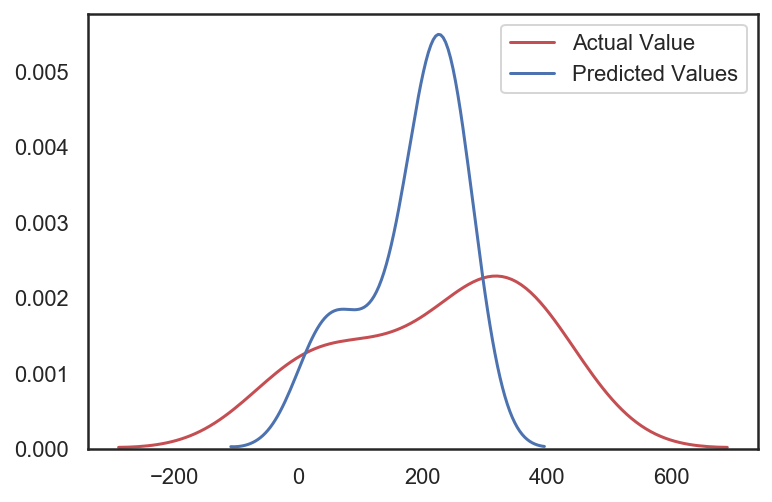

In [122]:
random_forest(bos_model, 'num_of_airbnb', max_depth =8 ,min_samples_leaf=4,min_samples_split=4,n_estimators=10)

0.5984649203847212
Mean Absolute Error: 13.86 degrees.
Accuracy: 95.39 %.


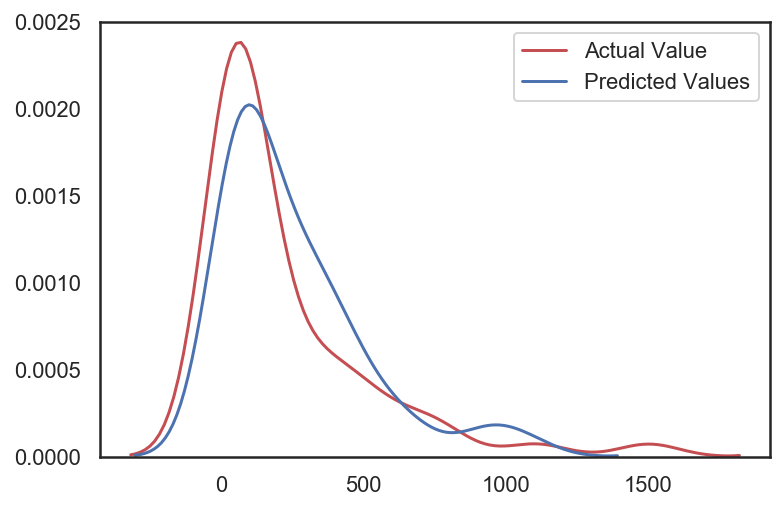

In [123]:
random_forest(ny_model, 'num_of_airbnb', max_depth =5 ,min_samples_leaf=4,min_samples_split=2,n_estimators=10)

0.06604454893318379
Mean Absolute Error: 37.36 degrees.
Accuracy: 88.0 %.


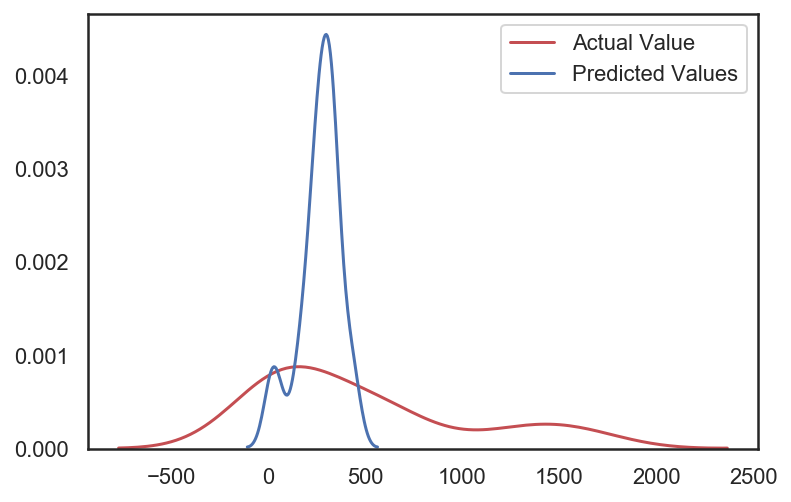

In [124]:
random_forest(dc_model, 'num_of_airbnb', max_depth =5 ,min_samples_leaf=4,min_samples_split=2,n_estimators=10)

<h3> 4-2 Clustering for Management

<li>We first used principal components analysis (PCA) to compress these 29 variables into 10 components. 

<li>Then, we tried k-means, DBSCAN and other 6 clustering methods to train our model with  three cities’ data. Through the visualization result of tsne, we found out that k-means clustering with 6 centers has the optimal clustering performance. 

<li>We then assigned these clusters with unique labels, that is ‘popular’, ‘residential’, ‘luxury’ , etc.  by analysing their characters.  These labels can provide insight for the management of airbnb in diverse areas. For example, the areas of  ‘residential’ type have a low tendency to rent and Airbnb supplies there are few despite a large number of restaurants and houses in this area. So when expanding into a new city, Airbnb may devote less effort in areas of this type.

<h4>4-2-1 PCA

In [125]:
total = pd.concat([ny_model,bos_model,dc_model],axis=0,sort=False)

In [126]:
X= total.drop(columns='zipcode')
X=X.fillna(0)
X_norm = preprocessing.scale(X)
pca = decomposition.PCA(n_components=34)
X_centered = X_norm - X_norm.mean(axis=0)
pca.fit(X_centered)
X_pca = pca.transform(X_centered)

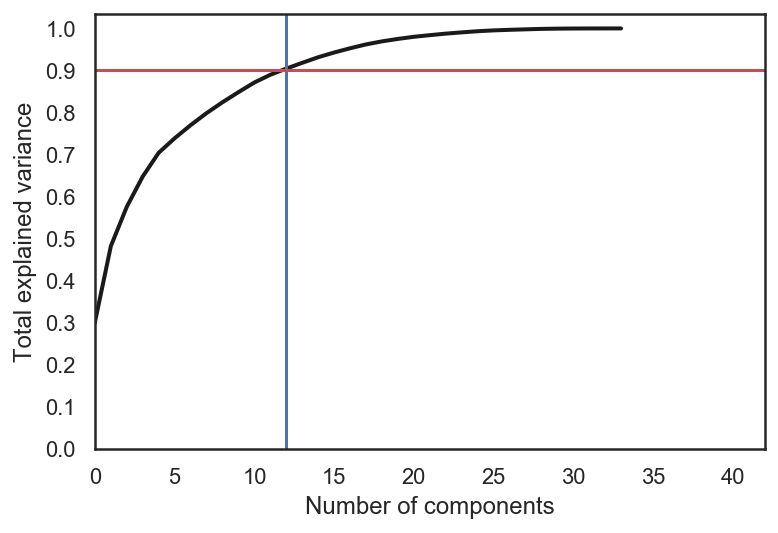

In [127]:
pca = decomposition.PCA().fit(X_centered)
plt.figure(figsize=(6,4))
plt.plot(np.cumsum(pca.explained_variance_ratio_), color='k', lw=2)
plt.xlabel('Number of components')
plt.ylabel('Total explained variance')
plt.xlim(0, 42)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axvline(12, c='b')
plt.axhline(0.9, c='r')
plt.show();

* 2 components can represent about 50% information of X
* 12 components can represent about 90% information of X

In [128]:
#features that compose each componet
for i, component in enumerate(pca.components_):
    print("{} component: {}% of initial variance".format(i + 1, 
          round(100 * pca.explained_variance_ratio_[i], 2)))
    print(pd.DataFrame(zip(component,X.columns)).sort_values(by=0,ascending=False))

1 component: 30.05% of initial variance
           0                                                  1
31  0.298611                         Renter_Occupied_Households
14  0.294582                                     youth_20_to_39
28  0.288786                                      num_of_2b_apt
12  0.286798                                   total_population
29  0.264771                                 num_of_3plus_b_apt
27  0.262529                                      num_of_1b_apt
9   0.257141                                      num_of_market
13  0.256223                                    num_of_children
17  0.206103                  American_Indian_Or_Alaskan_Native
26  0.201331                                  num_of_studio_apt
23  0.188854                           housing_built_after_1990
0   0.175750                                      num_of_airbnb
19  0.172528           household_income_less_than_25000_percent
15  0.164039                                              White


<h4> 4-2-2 Clustering

<h5> KMeans

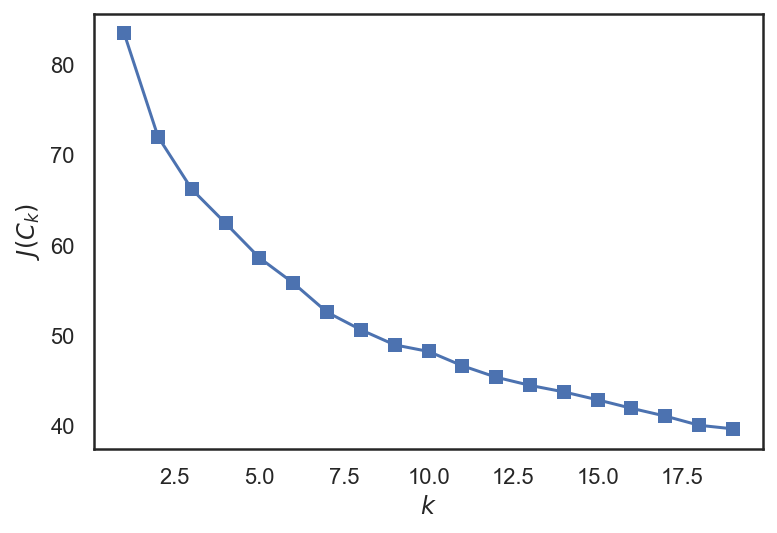

In [129]:
pca = decomposition.PCA(n_components=10)
X_reduced = pca.fit_transform(X_centered)
inertia = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(X_reduced)
    inertia.append(np.sqrt(kmeans.inertia_))

plt.plot(range(1, 20), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('$J(C_k)$');

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 241 samples in 0.000s...
[t-SNE] Computed neighbors for 241 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 241 / 241
[t-SNE] Mean sigma: 2.361522
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.213570
[t-SNE] KL divergence after 300 iterations: 0.550881


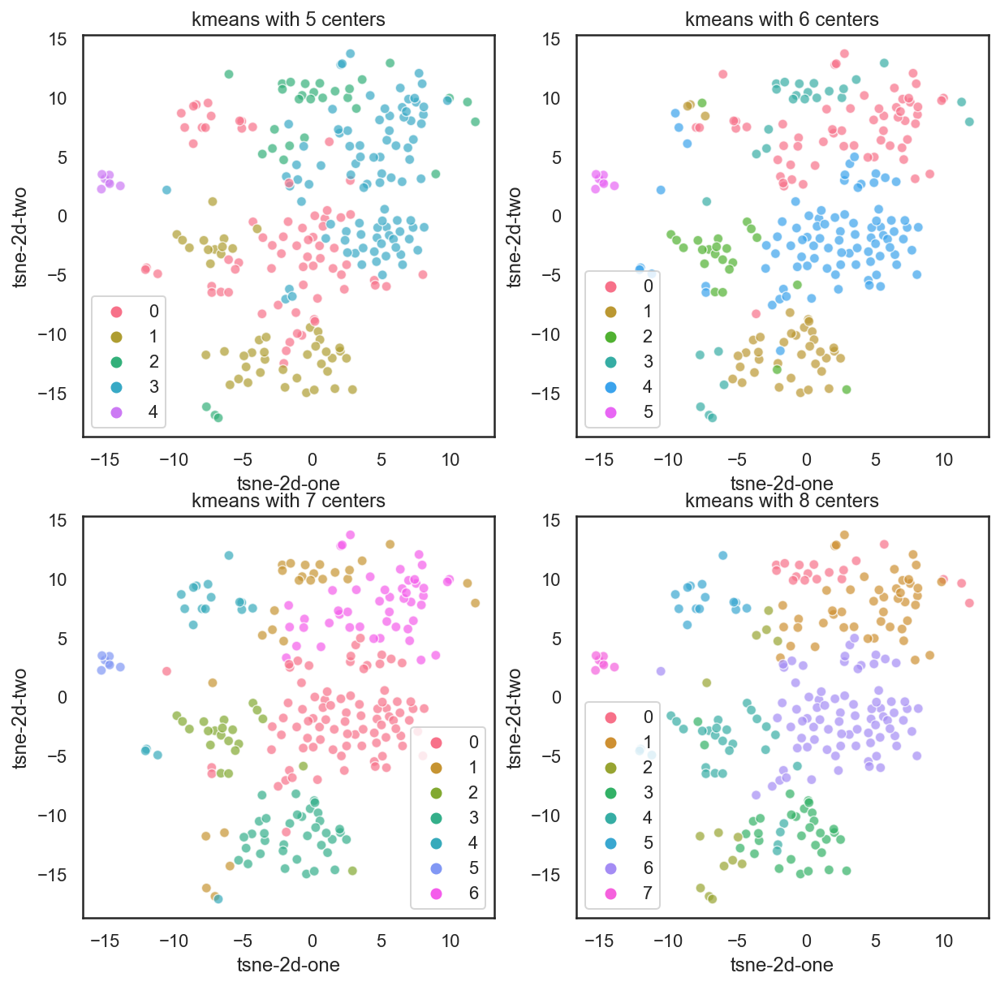

In [130]:
#visuliaze result with tsne
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X_norm)
df_subset = pd.DataFrame()
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

fig, axes = plt.subplots(2, 2,figsize=(10,10))
for i in range(5,9):
    y_pred= KMeans(n_clusters=i, random_state=170,max_iter=2000).fit_predict(X_pca)
    
    ax = axes[int((i-5)/2), (i-5)%2]
 
    ax.set_title(f'kmeans with {i} centers')  
   
    sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two", hue=y_pred,palette=sns.color_palette("husl",i),
                   data = df_subset,legend='full',alpha=0.7,ax=ax)

plt.show()

6 center works better 

<h5> KMedoids

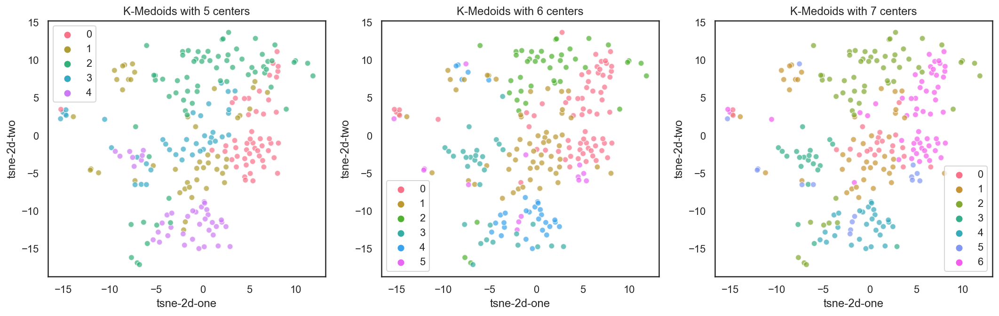

In [135]:
fig, axes = plt.subplots(1, 3,figsize=(18,5))
for i in range(5,8):
    y_pred= KMedoids(n_clusters=i, random_state=170,max_iter=2000).fit_predict(X_pca)
    ax = axes[i-5]   
    ax.set_title(f'K-Medoids with {i} centers')  
    sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two", hue=y_pred,palette=sns.color_palette("husl",i),
                   data = df_subset,legend='full',alpha=0.7,ax=ax)

plt.show()

<h5> Hierarchy clustering

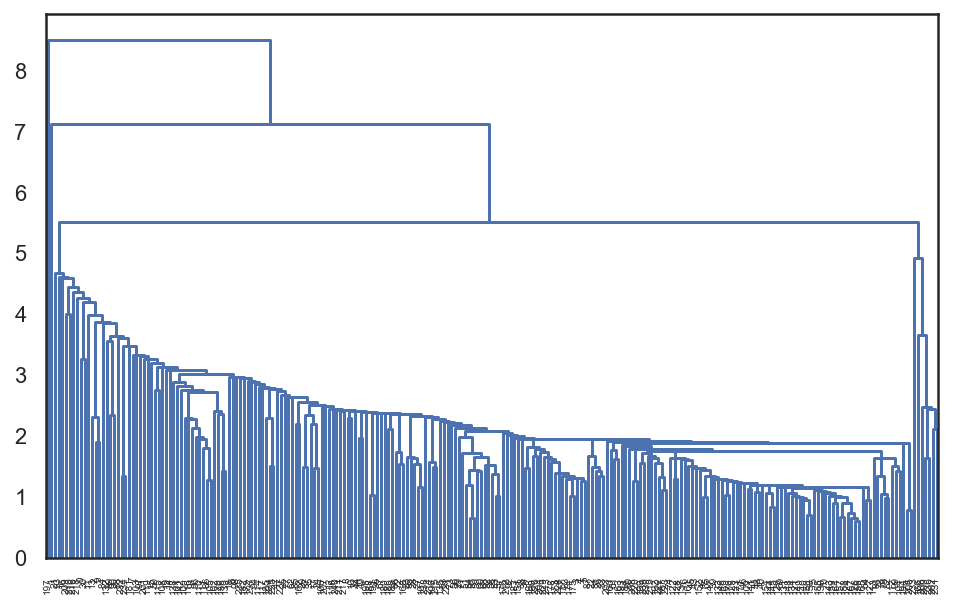

In [136]:
distance_mat = pdist(X_reduced) 
Z = hierarchy.linkage(distance_mat, 'single')
plt.figure(figsize=(8, 5))
dn = hierarchy.dendrogram(Z, color_threshold=0.2)

* hierarchy clustering result not good

<h5> Mean-Shift Clustering

number of estimated clusters : 6


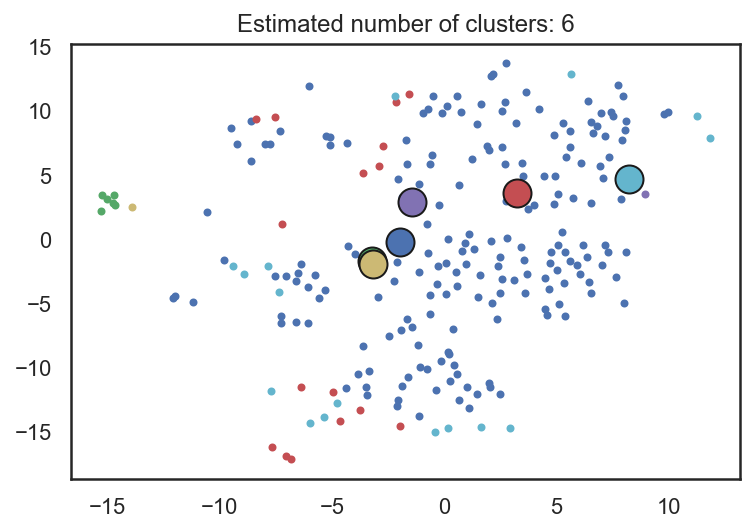

In [137]:
from sklearn.cluster import MeanShift, estimate_bandwidth
bandwidth = estimate_bandwidth(X_reduced, quantile=0.15)

ms = MeanShift(bandwidth=bandwidth,bin_seeding=True)
ms.fit(X_reduced)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)
from itertools import cycle

plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(df_subset.loc[my_members, 'tsne-2d-one'], df_subset.loc[my_members, 'tsne-2d-two'], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

<h5> DBSCAN

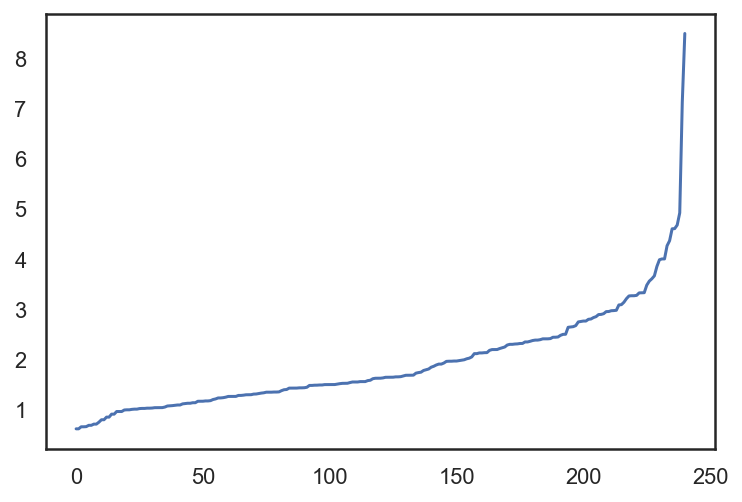

In [138]:
#find the optiaml eps
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_reduced)
distances, indices = nbrs.kneighbors(X_reduced)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

Estimated number of clusters: 3
Estimated number of noise points: 39
Silhouette Coefficient: 0.196


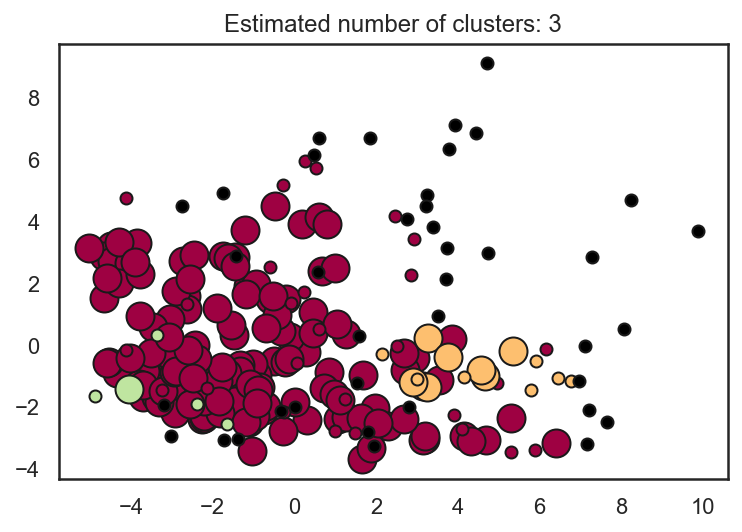

In [139]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

db = DBSCAN(eps=3).fit(X_reduced)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X_norm, labels))

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]
    class_member_mask = (labels == k)   
    xy = X_reduced[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    xy = X_reduced[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

DBSCAN denote too much noise points

<h5>EM

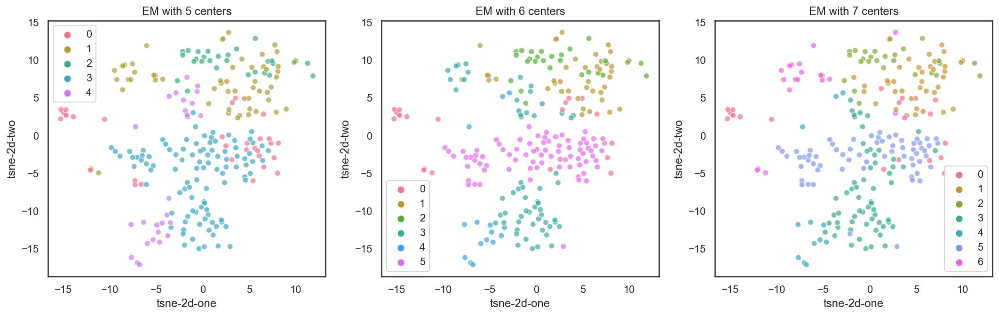

In [140]:
fig, axes = plt.subplots(1, 3,figsize=(18,5))
for i in range(5,8):
    y_pred= GaussianMixture(n_components=i, covariance_type='full', random_state=170,max_iter=2000).fit_predict(X_reduced)
    
    ax = axes[i-5]
    ax.set_title(f'EM with {i} centers')  
    sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two", hue=y_pred,palette=sns.color_palette("husl",i),
                   data = df_subset,legend='full',alpha=0.7,ax=ax)

plt.show()

<li> Conclusion:  Use K-means with 6 centers to clustering 



<h4> 4-2-3 Visuliza Clustering Result(New York Example)


In [141]:
kmeans_pred = KMeans(n_clusters=6, random_state=170,max_iter=2000).fit_predict(X_reduced)
total['kmeans_pred'] = kmeans_pred
ny_pred = total.loc[total.zipcode.isin(ny_zipcodes)]

In [142]:
ny_pred.zipcode = ny_pred.zipcode.apply(str)

In [143]:
def get_color(label):
    if label==0:
        c = '#FF9933'
    elif label ==1:
        c = '#3780BF'
    elif label ==2:
        c ='#32AB60'
    elif label ==3:
        c = '#800080'
    elif label ==4:
        c= '#DB4052'
    elif label ==5:
        c='black'
    else:
        c='white'
    return c

<h4> Location

In [144]:
cluster = ny_pred.set_index('zipcode')['kmeans_pred']

def style_function(feature):
    label = cluster.get(feature['properties']['postalCode'])                   
    return {
        'fillOpacity': 0.5,'weight': 0,'fillColor': get_color(label)}

m = folium.Map(location=[40.7589,-73.9851],zoom_start=12)

folium.GeoJson('zipcode_geojson_data/ny_zipcode.geojson',
style_function=style_function).add_to(m)
m

It successfully differentiated different types of areas with distinctive characters. 

<h4> Box Plot 

In [145]:
def draw_box(df,features,n):
    df=df.loc[df.kmeans_pred<5]
    fig = []

    for i in range(len(features)):
        table=df.pivot(values=f'{features[i]}',columns='kmeans_pred')
        fig.append(table.figure(kind='box',boxpoints='all',showlegend=False))
        
    iplot(cf.subplots(fig,shape=(n,2),subplot_titles=(features)))

<h5> Airbnb characters

In [146]:
draw_box(ny_pred,['num_of_airbnb','avg_price'],1)

<h5> Population characters

In [147]:
draw_box(ny_pred,['youth_20_to_39','White',
                  'Black_Or_African_American','household_income_less_than_25000_percent'],2)

In [148]:
draw_box(ny_pred,['employment_rate','bachelor_above_percentage'],1)

<h5> Convenience

In [149]:
ny_pred.columns

Index(['zipcode', 'num_of_airbnb', 'avg_price', 'total_reviews',
       'avg_location_review_score', 'avg_review_score', 'num_of_bus',
       'num_of_sub', 'c_distance', 'num_of_restaurant', 'num_of_market',
       'num_of_tourist_attractions', 'num_of_travel_agency',
       'total_population', 'num_of_children', 'youth_20_to_39', 'White',
       'Black_Or_African_American', 'American_Indian_Or_Alaskan_Native',
       'Asian', 'household_income_less_than_25000_percent',
       'bachelor_above_percentage', 'employment_rate', 'crimes_in_half_year',
       'housing_built_after_1990', 'home_value_less_than_400000',
       'home_value_more_than_400000', 'num_of_studio_apt', 'num_of_1b_apt',
       'num_of_2b_apt', 'num_of_3plus_b_apt',
       'vancancy_reason_For_Season_Recreational_Or_Occasional_Use',
       'Renter_Occupied_Households', 'Owned_Households_With_A_Mortgage',
       'zillow_rent_index', 'kmeans_pred'],
      dtype='object')

In [150]:
draw_box(ny_pred,['num_of_restaurant', 'num_of_market',
       'num_of_tourist_attractions','c_distance'],2)

<h5> Real Estate

In [151]:
draw_box(ny_pred,['zillow_rent_index', 'num_of_studio_apt',
       'housing_built_after_1990','Renter_Occupied_Households'],2)